<a href="https://colab.research.google.com/github/aeyeniay/AdvancedProject2/blob/main/AP_Tirta/Scenario%203/AP_Tirta_2018_2021_v3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## 1. Library

In [1]:
pip install --upgrade pandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
pip install lime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 KB 9.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283857 sha256=bc43874b9c95c057907eb64127036bf3b3976547748703c53f208515c4162b34
  Stored in directory: /root/.cache/pip/wheels/e6/a6/20/cc1e293fcdb67ede666fed293cb895395e7ecceb4467779546
Successfully built lime


In [4]:
%matplotlib inline
from warnings import simplefilter
import numpy as np 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt 
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error,r2_score,mean_squared_error,mean_absolute_percentage_error
from sklearn.ensemble import RandomForestRegressor
import shap
import lime
from lime import lime_tabular
shap.initjs()

In [5]:
def eval(evaluation,y_true,y_train_pred,name):
  a_dict = {}
  a_dict['MAE'] = mean_absolute_error(y_true,y_train_pred)
  a_dict['MSE'] = mean_squared_error(y_true,y_train_pred)
  a_dict['MAPE']= round(mean_absolute_percentage_error(y_true,y_train_pred),6)
  a_dict['R squared'] = r2_score(y_true,y_train_pred)
  a_dict['RMSE'] = np.sqrt(mean_squared_error(y_true,y_train_pred))
  a_dict['RMSLE'] = np.log(np.sqrt(mean_squared_error(y_true,y_train_pred)))
  evaluation[name] = a_dict

## 2. Dataset

In [6]:
df = pd.read_csv(
    "Rice-Data-2018-2021.csv",
    index_col='Date',
    parse_dates=['Date'],
)

df.head()

,Average Price of Premium Quality Rice,Average Price of Medium Quality Rice,Average Price of Bad Quality Rice,Harvest Area (10^6 ha),Produksi Padi Nasional (10^6 Ton),Produksi Beras Nasional (10^6 Ton),Productivity (ku/ha)
Date,,,,,,,
2018-01-01,10349.91,10177.05,9792.59,0.54,2.78,1.59,51.48
2018-02-01,10381.74,10215.16,9987.10,1.07,5.74,3.29,53.64
2018-03-01,9892.56,9698.23,9554.06,1.77,9.68,5.55,54.69
2018-04-01,9524.96,9220.84,8991.36,1.41,7.60,4.36,53.90
2018-05-01,9523.88,9190.37,9001.50,1.00,4.90,2.81,49.00


In [7]:
df['Date'] = df.index
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d') 
df['Month'] = df['Date'].dt.month
df['Time'] = np.arange(len(df.index))
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 48 entries, 2018-01-01 to 2021-12-01
Data columns (total 10 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   Average Price of Premium Quality Rice  48 non-null     float64       
 1   Average Price of Medium Quality Rice   48 non-null     float64       
 2   Average Price of Bad Quality Rice      48 non-null     float64       
 3   Harvest Area (10^6 ha)                 48 non-null     float64       
 4   Produksi Padi Nasional (10^6 Ton)      48 non-null     float64       
 5   Produksi Beras Nasional (10^6 Ton)     48 non-null     float64       
 6   Productivity (ku/ha)                   48 non-null     float64       
 7   Date                                   48 non-null     datetime64[ns]
 8   Month                                  48 non-null     int64         
 9   Time                                   48 non-n

In [8]:
df

,Average Price of Premium Quality Rice,Average Price of Medium Quality Rice,Average Price of Bad Quality Rice,Harvest Area (10^6 ha),Produksi Padi Nasional (10^6 Ton),Produksi Beras Nasional (10^6 Ton),Productivity (ku/ha),Date,Month,Time
Date,,,,,,,,,,
2018-01-01,10349.91,10177.05,9792.59,0.54,2.78,1.59,51.48,2018-01-01,1,0
2018-02-01,10381.74,10215.16,9987.10,1.07,5.74,3.29,53.64,2018-02-01,2,1
2018-03-01,9892.56,9698.23,9554.06,1.77,9.68,5.55,54.69,2018-03-01,3,2
2018-04-01,9524.96,9220.84,8991.36,1.41,7.60,4.36,53.90,2018-04-01,4,3
2018-05-01,9523.88,9190.37,9001.50,1.00,4.90,2.81,49.00,2018-05-01,5,4
2018-06-01,9478.05,9135.41,8941.38,0.89,4.49,2.57,50.45,2018-06-01,6,5
2018-07-01,9519.93,9197.78,9014.56,1.07,5.43,3.12,50.75,2018-07-01,7,6
2018-08-01,9458.07,9172.27,8976.97,1.09,5.37,3.08,49.27,2018-08-01,8,7
2018-09-01,9572.03,9309.98,9125.00,1.01,5.18,2.97,51.29,2018-09-01,9,8


In [9]:
df.describe()

,Average Price of Premium Quality Rice,Average Price of Medium Quality Rice,Average Price of Bad Quality Rice,Harvest Area (10^6 ha),Produksi Padi Nasional (10^6 Ton),Produksi Beras Nasional (10^6 Ton),Productivity (ku/ha),Month,Time
count,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.00
mean,9731.792708,9379.253333,9085.215000,0.896458,4.645833,2.665208,52.968958,6.500000,23.50
std,240.875355,323.596826,317.174428,0.417294,2.186646,1.270172,9.761144,3.488583,14.00
min,9401.610000,8886.900000,8481.430000,0.290000,1.620000,0.930000,30.380000,1.000000,0.00
25%,9524.690000,9151.310000,8929.802500,0.562500,3.200000,1.800000,49.615000,3.750000,11.75
50%,9693.520000,9358.795000,9020.305000,0.840000,4.195000,2.450000,51.490000,6.500000,23.50
75%,9876.480000,9557.910000,9246.850000,1.075000,5.450000,3.187500,54.022500,9.250000,35.25
max,10381.740000,10215.160000,9987.100000,1.860000,9.680000,5.600000,86.380000,12.000000,47.00


# 3. Exploratory Data Analysis (EDA)

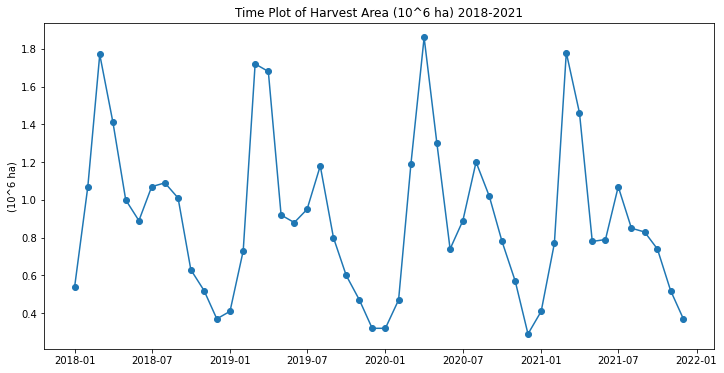

In [10]:
fig = plt.figure(figsize=(12, 6))
plt.plot(df['Harvest Area (10^6 ha)'],marker='o') 
plt.title('Time Plot of Harvest Area (10^6 ha) 2018-2021')
plt.ylabel("(10^6 ha)")
plt.show()

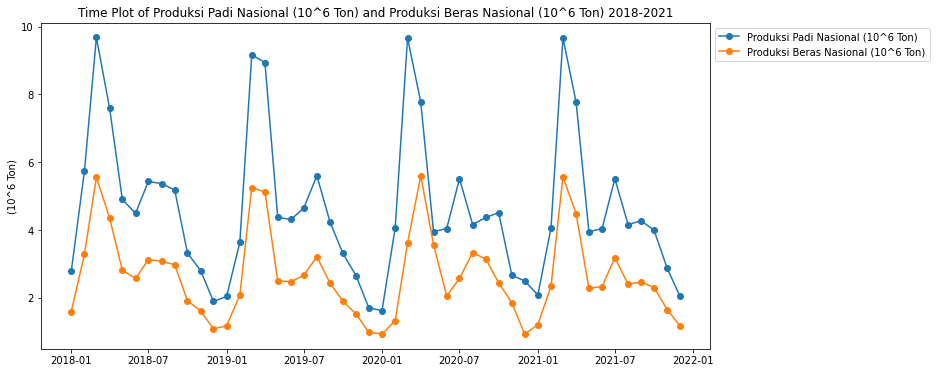

In [11]:
fig = plt.figure(figsize=(12, 6))
plt.plot(df['Produksi Padi Nasional (10^6 Ton)'],marker='o',label = 'Produksi Padi Nasional (10^6 Ton)') 
plt.plot(df['Produksi Beras Nasional (10^6 Ton)'],marker='o',label = 'Produksi Beras Nasional (10^6 Ton)') 
plt.title('Time Plot of Produksi Padi Nasional (10^6 Ton) and Produksi Beras Nasional (10^6 Ton) 2018-2021')
plt.legend(bbox_to_anchor = (1.0, 1), loc = 'upper left')
plt.ylabel("(10^6 Ton)")
plt.show()

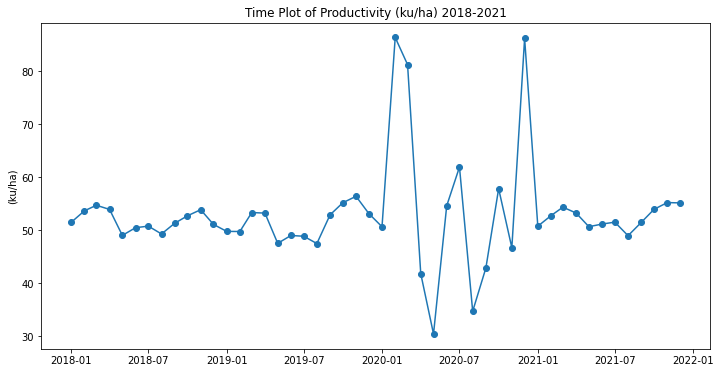

In [12]:
fig = plt.figure(figsize=(12, 6))
plt.plot(df['Productivity (ku/ha)'],marker='o') 
plt.title('Time Plot of Productivity (ku/ha) 2018-2021')
plt.ylabel("(ku/ha)")
plt.show()

In [13]:
df = df.drop(columns=['Date'])

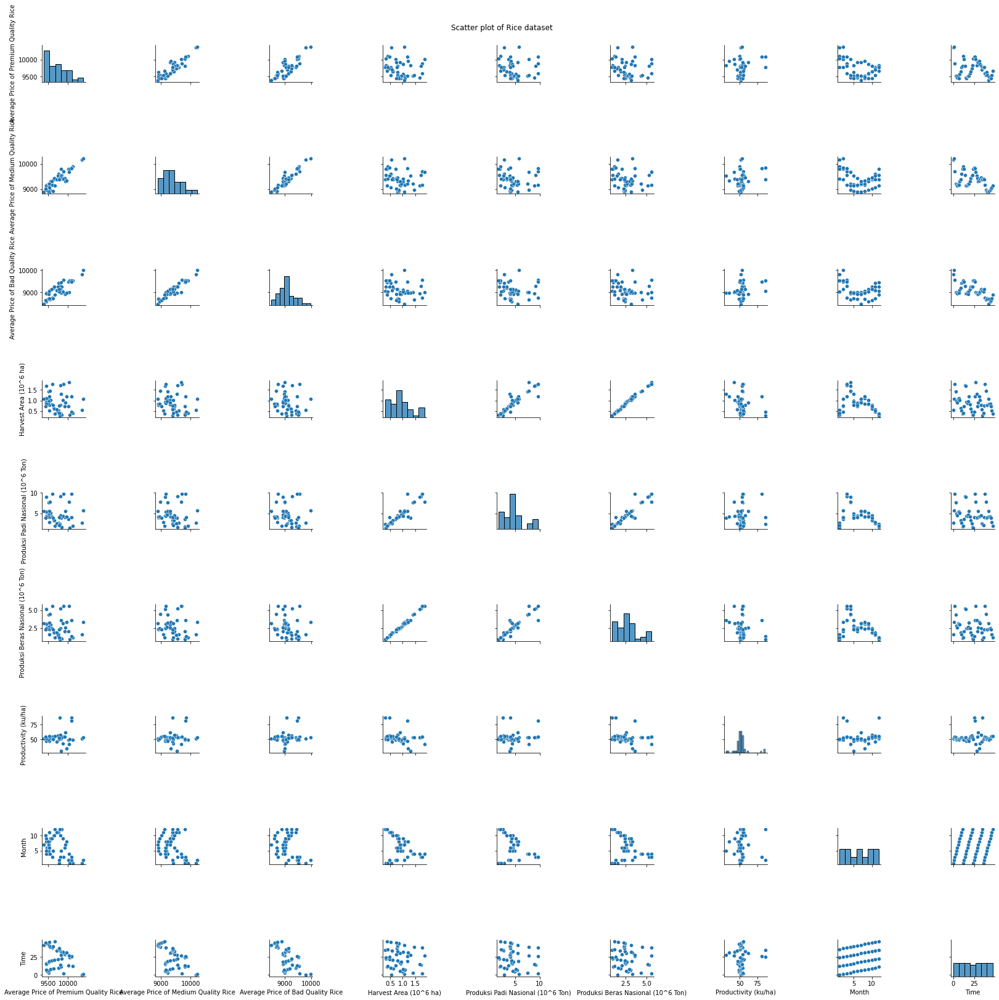

In [14]:
df_plot = df.copy()

g = sns.pairplot(df_plot)
g.fig.suptitle('Scatter plot of Rice dataset')
plt.tight_layout()
plt.show()

    From the results of the Scatter plots above, the following analysis results are obtained: 
    There are several features that have a linear relationship, 
    namely the relationship between Average Price of Premium Quality Rice, Average Price of Medium Quality Rice, and Average Price of Bad Quality Rice. 
    In addition, between harvest area, National Rice Production, and National Rice Production. 
    As well as between time and month.

# 4. Feature Engineering

## Feature Scalling (Normalization)

In [15]:
from sklearn.preprocessing import MinMaxScaler

In [16]:
mmscalar_premium = MinMaxScaler()
df[['Average Price of Premium Quality Rice']] = mmscalar_premium.fit_transform(df[['Average Price of Premium Quality Rice']])

In [17]:
mmscalar_medium = MinMaxScaler()
df[['Average Price of Medium Quality Rice']] = mmscalar_medium.fit_transform(df[['Average Price of Medium Quality Rice']])

In [18]:
mmscalar_bad = MinMaxScaler()
df[['Average Price of Bad Quality Rice']] = mmscalar_bad.fit_transform(df[['Average Price of Bad Quality Rice']])

In [19]:
mmscalar_prod = MinMaxScaler()
df[['Productivity (ku/ha)']] = mmscalar_prod.fit_transform(df[['Productivity (ku/ha)']])

##  Correlation Matrix

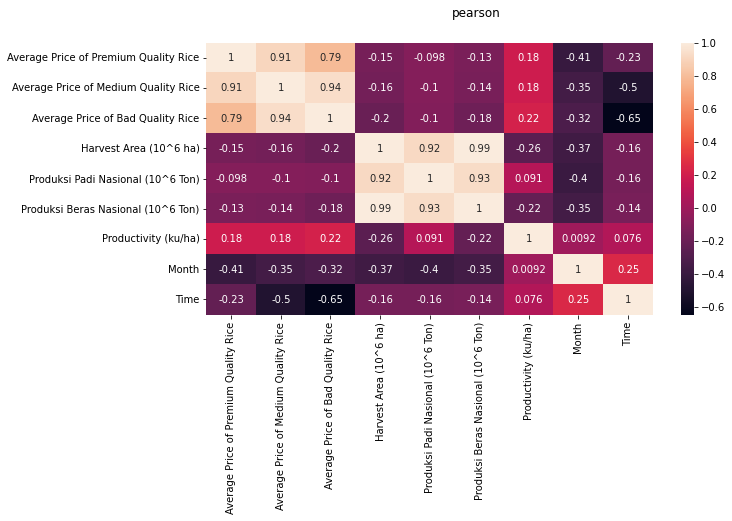

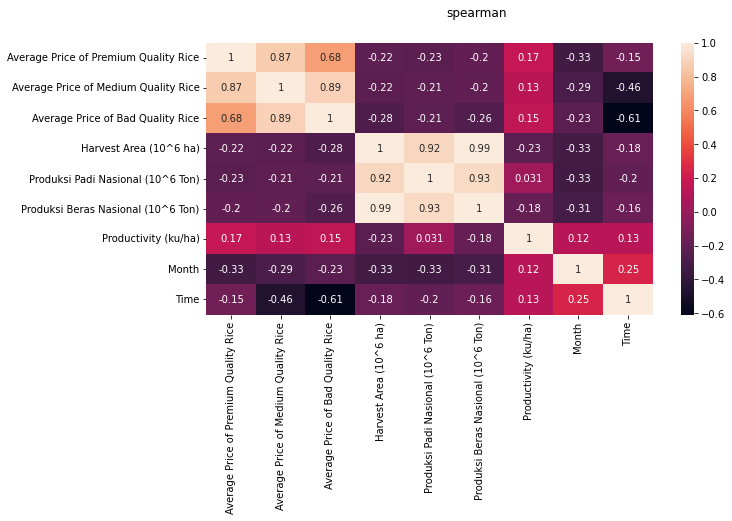

In [20]:
items = ['pearson', 'spearman']
for item in items:
    fig, axe = plt.subplots(figsize=(10,5))
    fig.suptitle(item)
    sns.heatmap(df.corr(method=item, numeric_only=True), annot=True)
    plt.show()


# 4.1 Correlation for Average Price of Premium Quality Rice

In [21]:
df.corr(method='pearson', numeric_only=True).sort_values('Average Price of Premium Quality Rice', ascending=False)['Average Price of Premium Quality Rice']

Average Price of Premium Quality Rice    1.000000
Average Price of Medium Quality Rice     0.906342
Average Price of Bad Quality Rice        0.787889
Productivity (ku/ha)                     0.184831
Produksi Padi Nasional (10^6 Ton)       -0.097793
Produksi Beras Nasional (10^6 Ton)      -0.132439
Harvest Area (10^6 ha)                  -0.145494
Time                                    -0.228418
Month                                   -0.407455
Name: Average Price of Premium Quality Rice, dtype: float64

By using Pearson, It seems like Average Price of Medium Quality Rice, Average Price of Bad Quality Rice, and Productivity (ku/ha) have a positive correlation with Average Price of Premium Quality Rice

In [22]:
df.corr(method='spearman', numeric_only=True).sort_values('Average Price of Premium Quality Rice', ascending=False)['Average Price of Premium Quality Rice']

Average Price of Premium Quality Rice    1.000000
Average Price of Medium Quality Rice     0.866913
Average Price of Bad Quality Rice        0.682914
Productivity (ku/ha)                     0.168802
Time                                    -0.149370
Produksi Beras Nasional (10^6 Ton)      -0.199593
Harvest Area (10^6 ha)                  -0.218753
Produksi Padi Nasional (10^6 Ton)       -0.230788
Month                                   -0.327599
Name: Average Price of Premium Quality Rice, dtype: float64

By using spearman, most of the correlated features with Average Price of Premium Quality Rice are similar

Text(0, 0.5, 'Average Price of Medium Quality Rice')

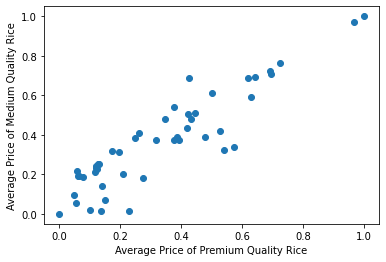

In [23]:
# Corelation between Average Price of Premium Quality Rice and Average Price of Medium Quality Rice 
plt.scatter(df['Average Price of Premium Quality Rice'], df['Average Price of Medium Quality Rice'])
plt.xlabel("Average Price of Premium Quality Rice")
plt.ylabel("Average Price of Medium Quality Rice")

Text(0, 0.5, 'Average Price of Bad Quality Rice')

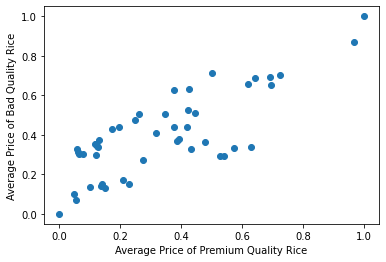

In [24]:
# Corelation between Average Price of Premium Quality Rice and Average Price of Bad Quality Rice 
plt.scatter(df['Average Price of Premium Quality Rice'], df['Average Price of Bad Quality Rice'])
plt.xlabel("Average Price of Premium Quality Rice")
plt.ylabel("Average Price of Bad Quality Rice")

Text(0, 0.5, 'Productivity (ku/ha)')

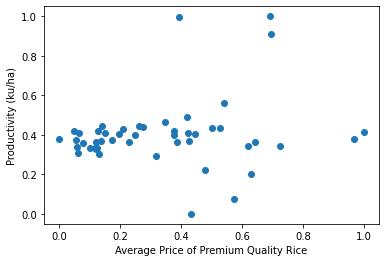

In [25]:
# Corelation between Average Price of Premium Quality Rice and Productivity (ku/ha)
plt.scatter(df['Average Price of Premium Quality Rice'], df['Productivity (ku/ha)'])
plt.xlabel("Average Price of Premium Quality Rice")
plt.ylabel("Productivity (ku/ha)")

# 4.2 Correlation for Average Price of Medium Quality Rice

In [26]:
df.corr(method='pearson', numeric_only=True).sort_values('Average Price of Medium Quality Rice', ascending=False)['Average Price of Medium Quality Rice']

Average Price of Medium Quality Rice     1.000000
Average Price of Bad Quality Rice        0.939900
Average Price of Premium Quality Rice    0.906342
Productivity (ku/ha)                     0.184865
Produksi Padi Nasional (10^6 Ton)       -0.099594
Produksi Beras Nasional (10^6 Ton)      -0.144158
Harvest Area (10^6 ha)                  -0.159867
Month                                   -0.354664
Time                                    -0.504250
Name: Average Price of Medium Quality Rice, dtype: float64

By using Pearson, It seems like Average Price of Premium Quality Rice, Average Price of Bad Quality Rice, and Productivity (ku/ha) have a positive correlation with Average Price of Medium Quality Rice

In [27]:
df.corr(method='spearman', numeric_only=True).sort_values('Average Price of Medium Quality Rice', ascending=False)['Average Price of Medium Quality Rice']

Average Price of Medium Quality Rice     1.000000
Average Price of Bad Quality Rice        0.892097
Average Price of Premium Quality Rice    0.866913
Productivity (ku/ha)                     0.130699
Produksi Beras Nasional (10^6 Ton)      -0.203664
Produksi Padi Nasional (10^6 Ton)       -0.210375
Harvest Area (10^6 ha)                  -0.223097
Month                                   -0.291006
Time                                    -0.464611
Name: Average Price of Medium Quality Rice, dtype: float64

By using spearman, most of the correlated features with Average Price of Medium Quality Rice Rice are similar

Text(0, 0.5, 'Average Price of Bad Quality Rice')

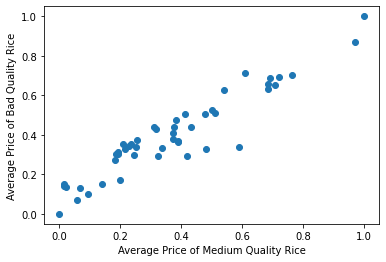

In [28]:
# Corelation between Average Price of Medium Quality Rice and Average Price of Bad Quality Rice 
plt.scatter(df['Average Price of Medium Quality Rice'], df['Average Price of Bad Quality Rice'])
plt.xlabel("Average Price of Medium Quality Rice")
plt.ylabel("Average Price of Bad Quality Rice")

Text(0, 0.5, 'Average Price of Premium Quality Rice')

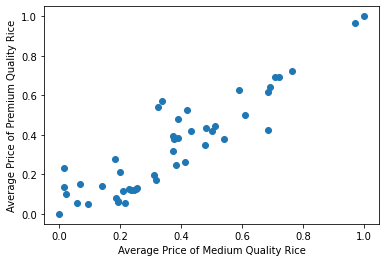

In [29]:
# Corelation between Average Price of Medium Quality Rice and Average Price of Premium Quality Rice 
plt.scatter(df['Average Price of Medium Quality Rice'], df['Average Price of Premium Quality Rice'])
plt.xlabel("Average Price of Medium Quality Rice")
plt.ylabel("Average Price of Premium Quality Rice")

Text(0, 0.5, 'Productivity (ku/ha)')

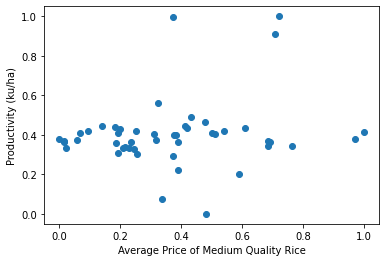

In [30]:
# Corelation between Average Price of Medium Quality Rice and Productivity (ku/ha)
plt.scatter(df['Average Price of Medium Quality Rice'], df['Productivity (ku/ha)'])
plt.xlabel("Average Price of Medium Quality Rice")
plt.ylabel("Productivity (ku/ha)")

# 4.3 Correlation for Average Price of Bad Quality Rice

In [31]:
df.corr(method='pearson', numeric_only=True).sort_values('Average Price of Bad Quality Rice', ascending=False)['Average Price of Bad Quality Rice']

Average Price of Bad Quality Rice        1.000000
Average Price of Medium Quality Rice     0.939900
Average Price of Premium Quality Rice    0.787889
Productivity (ku/ha)                     0.216919
Produksi Padi Nasional (10^6 Ton)       -0.104705
Produksi Beras Nasional (10^6 Ton)      -0.180882
Harvest Area (10^6 ha)                  -0.198405
Month                                   -0.317138
Time                                    -0.646867
Name: Average Price of Bad Quality Rice, dtype: float64

By using Pearson, It seems like Average Price of Premium Quality Rice, Average Price of Medium Quality Rice, and Productivity (ku/ha) have a positive correlation with Average Price of Bad Quality Rice

In [32]:
df.corr(method='spearman', numeric_only=True).sort_values('Average Price of Bad Quality Rice', ascending=False)['Average Price of Bad Quality Rice']

Average Price of Bad Quality Rice        1.000000
Average Price of Medium Quality Rice     0.892097
Average Price of Premium Quality Rice    0.682914
Productivity (ku/ha)                     0.145571
Produksi Padi Nasional (10^6 Ton)       -0.213144
Month                                   -0.225660
Produksi Beras Nasional (10^6 Ton)      -0.263591
Harvest Area (10^6 ha)                  -0.280867
Time                                    -0.608554
Name: Average Price of Bad Quality Rice, dtype: float64

By using spearman, most of the correlated features with Average Price of Bad Quality Rice Rice are similar

Text(0.5, 0, 'Average Price of Bad Quality Rice')

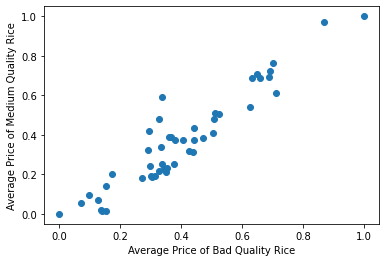

In [33]:
# Corelation between Average Price of Bad Quality Rice and Average Price of Medium Quality Rice 
plt.scatter(df['Average Price of Bad Quality Rice'], df['Average Price of Medium Quality Rice'])
plt.ylabel("Average Price of Medium Quality Rice")
plt.xlabel("Average Price of Bad Quality Rice")

Text(0, 0.5, 'Average Price of Premium Quality Rice')

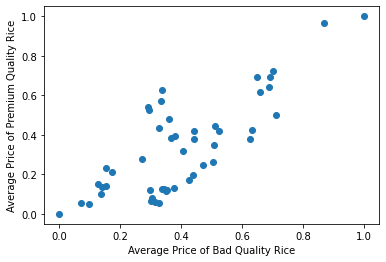

In [34]:
# Corelation between Average Price of Bad Quality Rice and Average Price of Premium Quality Rice 
plt.scatter(df['Average Price of Bad Quality Rice'], df['Average Price of Premium Quality Rice'])
plt.xlabel("Average Price of Bad Quality Rice")
plt.ylabel("Average Price of Premium Quality Rice")

Text(0, 0.5, 'Productivity (ku/ha)')

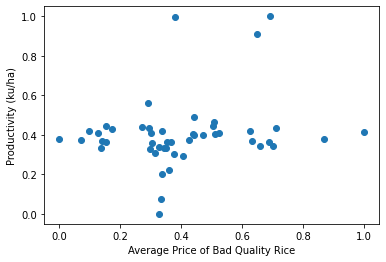

In [35]:
# Corelation between Average Price of Bad Quality Rice and Productivity (ku/ha)
plt.scatter(df['Average Price of Bad Quality Rice'], df["Productivity (ku/ha)"])
plt.xlabel("Average Price of Bad Quality Rice")
plt.ylabel("Productivity (ku/ha)")

# 5. Split dataset to train and test datasets
    df_train is rice data from 2018-2020
    df_test is rice data in 2021

In [36]:
df_train = df.iloc[:36,:]
df_test = df.iloc[36:,:]

In [37]:
# Training data
Time_train = df_train.loc[:, ['Time']]  # features
Monthly_train = df_train.loc[:, ['Month']]  # features
x_premium_train = df_train.loc[:, df_train.columns != 'Average Price of Premium Quality Rice'] # features
x_medium_train = df_train.loc[:, df_train.columns != 'Average Price of Medium Quality Rice'] # features
x_bad_train = df_train.loc[:, df_train.columns != 'Average Price of Bad Quality Rice'] # features
HargaBerasPremium_train = df_train.loc[:, 'Average Price of Premium Quality Rice']  # target
HargaBerasMedium_train = df_train.loc[:, 'Average Price of Medium Quality Rice']  # target
HargaBerasLuarkualitas_train = df_train.loc[:, 'Average Price of Bad Quality Rice'] # target

In [38]:
# Test Data
Time_test = df_test.loc[:, ['Time']]  # features
Monthly_test = df_test.loc[:, ['Month']]  # features
x_premium_test = df_test.loc[:, df_test.columns != 'Average Price of Premium Quality Rice'] # features
x_medium_test = df_test.loc[:, df_test.columns != 'Average Price of Medium Quality Rice'] # features
x_bad_test = df_test.loc[:, df_test.columns != 'Average Price of Bad Quality Rice'] # features
HargaBerasPremium_test = df_test.loc[:, 'Average Price of Premium Quality Rice']  # target
HargaBerasMedium_test = df_test.loc[:, 'Average Price of Medium Quality Rice']  # target
HargaBerasLuarkualitas_test = df_test.loc[:, 'Average Price of Bad Quality Rice'] # target

In [39]:
evaluation_train = {}
evaluation_test = {}

### SIMPLE LINEAR REGRESSION
### Average Price of Premium Quality Rice

In [40]:
# Train the model
model = LinearRegression()
model.fit(Time_train, HargaBerasPremium_train)

# Koefisien model
print ('Coefficients: ', model.coef_)
print ('Intercept: ',model.intercept_)
accuracy = model.score(Time_train, HargaBerasPremium_train)
print("Model Accuracy: ", accuracy)

Coefficients:  [0.00311273]
Intercept:  0.3359799608613529
Model Accuracy:  0.016690549529405074


Predicting on Train Data

In [41]:
AvgPricePremium_train = pd.Series(model.predict(Time_train), index=Time_train.index)

eval(evaluation_train,HargaBerasPremium_train,AvgPricePremium_train,'Train SLR Premium')

Predicting on Test Data

In [42]:
AvgPricePremium_pred = pd.Series(model.predict(Time_test), index=Time_test.index)

eval(evaluation_test,HargaBerasPremium_test,AvgPricePremium_pred,'Test SLR Premium')

### Multiple Linear Regression
### Average Price of Premium Quality Rice

In [43]:
regr = LinearRegression()
regr.fit(x_premium_train,HargaBerasPremium_train)

print('Coefficients: ', regr.coef_)
print ('Intercept: ',regr.intercept_)

accuracy = regr.score(x_premium_train,HargaBerasPremium_train)
print("Model Accuracy: ", accuracy)

Coefficients:  [ 1.23852471 -0.23546591  0.16993229 -0.00212649 -0.04614572  0.00866116
 -0.00770662  0.00548722]
Intercept:  -0.12592309255313777
Model Accuracy:  0.9169828877628834


Predicting on Train Data

In [44]:
AvgPricePremium_train_v2 = pd.Series(regr.predict(x_premium_train), index=x_premium_train.index)

eval(evaluation_train,HargaBerasPremium_train,AvgPricePremium_train_v2,'Train MLR Premium')

Predicting on Test Data

In [45]:
AvgPricePremium_pred_v2 = pd.Series(regr.predict(x_premium_test), index=x_premium_test.index)

eval(evaluation_test,HargaBerasPremium_test,AvgPricePremium_pred_v2,'Test MLR Premium')

explain the model's predictions using SHAP

Shapley on Train Data

In [46]:
explainer = shap.Explainer(regr, x_premium_train)
shap_values = explainer(x_premium_train)

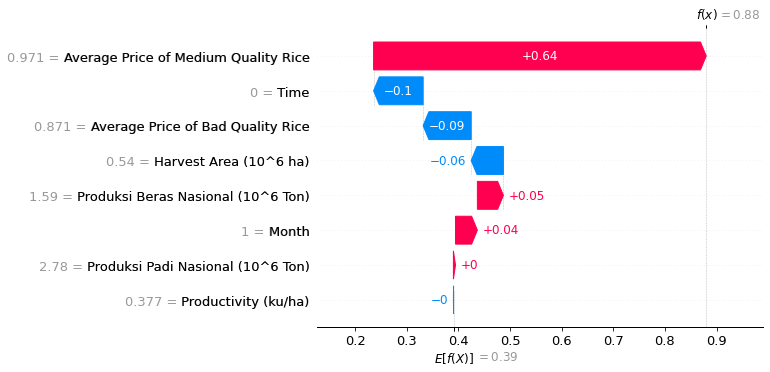

In [47]:
shap.plots.waterfall(shap_values[0])

In [48]:
shap_values = explainer.shap_values(x_premium_train)

In [49]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, x_premium_train,link="logit")

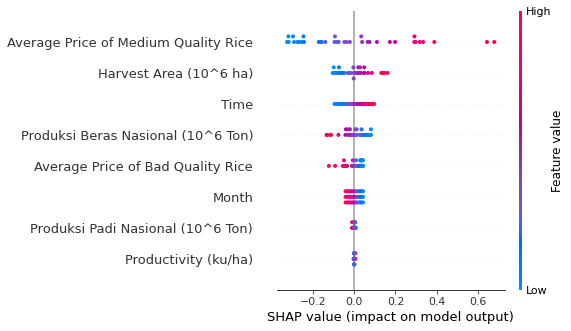

In [50]:
shap.summary_plot(shap_values, x_premium_train)

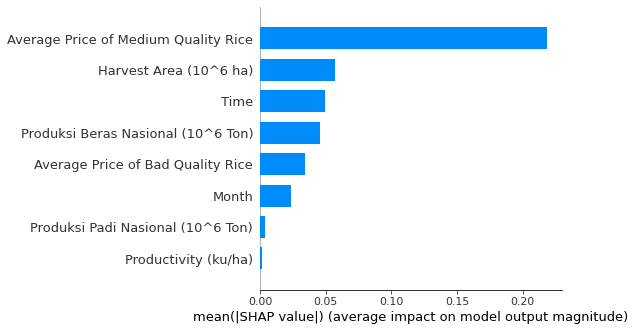

In [51]:
shap.summary_plot(shap_values, x_premium_train, plot_type ="bar")

    The feature important that has the largest average SHAP value in the Multiple Linear Regression method on Average Price of Premium Quality Rice is  Average Price of Medium Quality Rice. High values of the Average Price of Medium Quality Rice variable have a high positive contribution on the prediction, while low values have a high negative contribution.

Shapley on Test Data

In [52]:
explainer = shap.Explainer(regr, x_premium_test)
shap_values = explainer(x_premium_test)

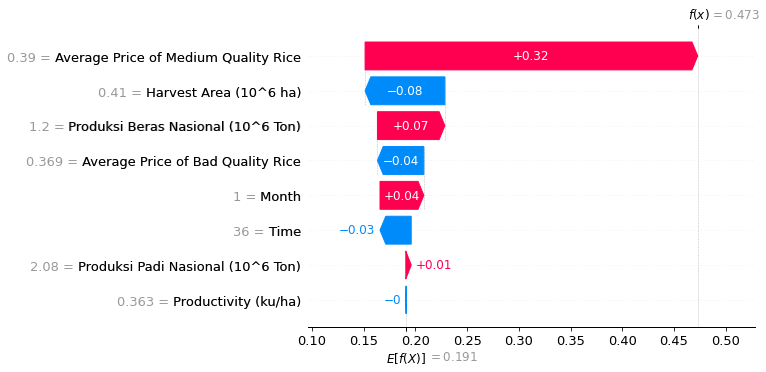

In [53]:
shap.plots.waterfall(shap_values[0])

In [54]:
shap_values = explainer.shap_values(x_premium_test)

In [55]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, x_premium_test,link="logit")

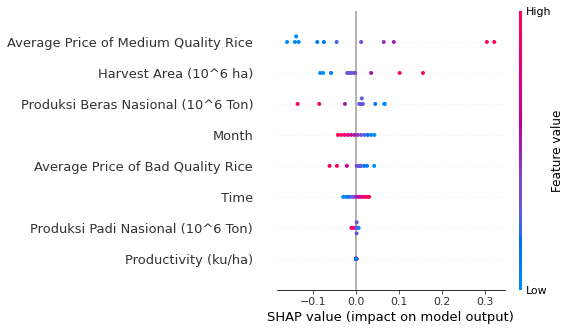

In [56]:
shap.summary_plot(shap_values, x_premium_test)

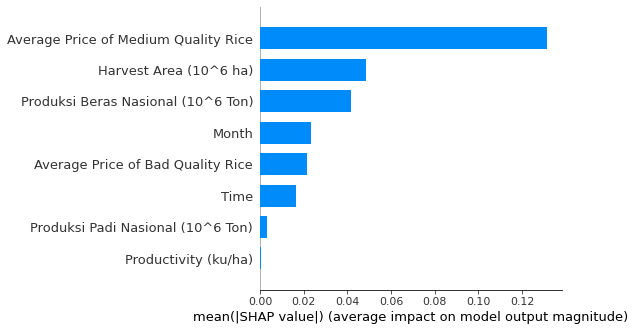

In [57]:
shap.summary_plot(shap_values, x_premium_test, plot_type ="bar")

    The feature important that has the largest average SHAP value in the Multiple Linear Regression method on Average Price of Premium Quality Rice is  Average Price of Medium Quality Rice. High values of the Average Price of Medium Quality Rice variable have a high positive contribution on the prediction, while low values have a high negative contribution.

### explain the model's predictions using Lime

In [58]:
# Create the Explainer
explainer = lime.lime_tabular.LimeTabularExplainer(x_premium_train.values, feature_names=x_premium_train.columns.values.tolist(),
                                                  class_names=['Average Price of Premium Quality Rice'], verbose=True, mode='regression')

In [59]:
# Choose the 5th instance and use it to predict the results
j = 5
exp = explainer.explain_instance(x_premium_test.values[j], regr.predict, num_features=len(x_premium_test.columns.values.tolist()))

Intercept 0.44414135671962884
Prediction_local [0.23660708]
Right: 0.059202643779977804


X does not have valid feature names, but LinearRegression was fitted with feature names


In [60]:
# Show the predictions
exp.show_in_notebook(show_table=True)

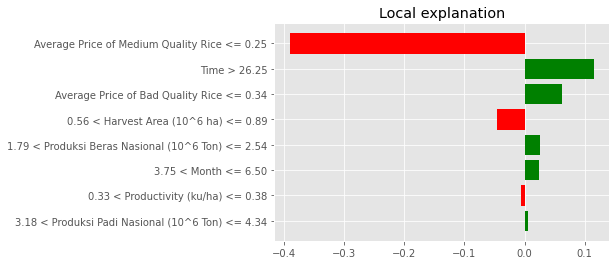

In [61]:
with plt.style.context("ggplot"):
    exp.as_pyplot_figure()

In [62]:
exp.as_list()

[('Average Price of Medium Quality Rice <= 0.25', -0.3907222674935663),
 ('Time > 26.25', 0.11553943207088413),
 ('Average Price of Bad Quality Rice <= 0.34', 0.06303253470782644),
 ('0.56 < Harvest Area (10^6 ha) <= 0.89', -0.0452523836125431),
 ('1.79 < Produksi Beras Nasional (10^6 Ton) <= 2.54', 0.02537867156422593),
 ('3.75 < Month <= 6.50', 0.024509665789925642),
 ('0.33 < Productivity (ku/ha) <= 0.38', -0.005324106612829098),
 ('3.18 < Produksi Padi Nasional (10^6 Ton) <= 4.34', 0.005304179556108932)]

## Random Forest
### Average Price of Premium Quality Rice

In [63]:
# Train the model
regressor = RandomForestRegressor(n_estimators = 1000, random_state=42)
regressor.fit(x_premium_train,HargaBerasPremium_train)

accuracy = regressor.score(x_premium_train,HargaBerasPremium_train)
print("Model Accuracy: ", accuracy)

Model Accuracy:  0.9779751736797522


Predicting on Train Data

In [64]:
AvgPricePremium_train_with_randomforest = pd.Series(regressor.predict(x_premium_train), index=x_premium_train.index)

eval(evaluation_train,HargaBerasPremium_train,AvgPricePremium_train_with_randomforest,'Train RF Premium')

Predicting on Test Data

In [65]:
AvgPricePremium_pred_with_randomforest = pd.Series(regressor.predict(x_premium_test), index=x_premium_test.index)

eval(evaluation_test,HargaBerasPremium_test,AvgPricePremium_pred_with_randomforest,'Test RF Premium')

# explain the model's predictions using SHAP

In [66]:
explainer = shap.TreeExplainer(regressor)

Shap Explanation at Train Data

In [67]:
shap_values = explainer.shap_values(x_premium_train)

In [68]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values,x_premium_train,link="logit")

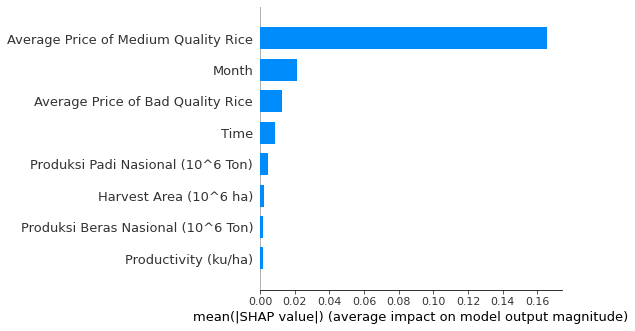

In [69]:
shap.summary_plot(shap_values, x_premium_train, plot_type="bar")

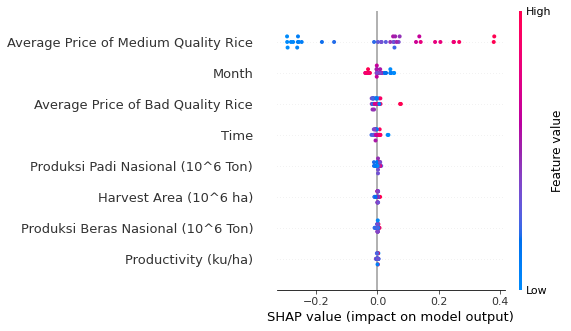

In [70]:
shap.summary_plot(shap_values, x_premium_train)

    The feature important that has the largest average SHAP value in the Random Forest Regression method on Average Price of Premium Quality Rice is  Average Price of Medium Quality Rice. High values of the Average Price of Medium Quality Rice variable have a high positive contribution on the prediction, while low values have a high negative contribution.

Shap Explanation at Test Data

In [71]:
shap_values = explainer.shap_values(x_premium_test)

In [72]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values,x_premium_test,link="logit")

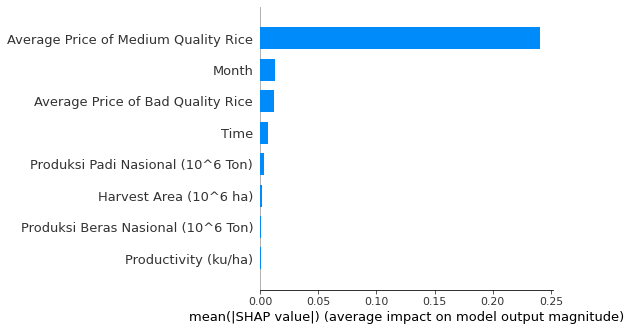

In [73]:
shap.summary_plot(shap_values, x_premium_test, plot_type="bar")

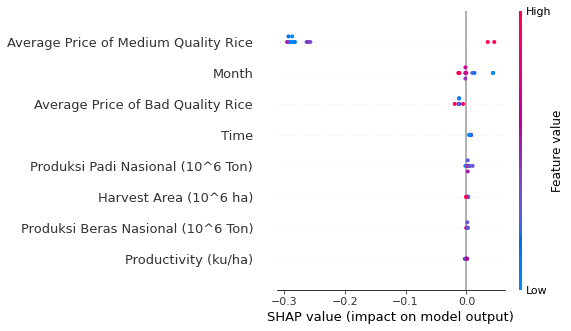

In [74]:
shap.summary_plot(shap_values, x_premium_test)

    The feature important that has the largest average SHAP value in the Random Forest method on Premium Quality Rice is Average Price of Medium Quality Rice. High values of the Average Price of Medium Quality Rice variable have a high positive contribution on the prediction, while low values have a high negative contribution.

### explain the model's predictions using Lime

In [75]:
# Create the Explainer
explainer = lime.lime_tabular.LimeTabularExplainer(x_premium_train.values, feature_names=x_premium_train.columns.values.tolist(),
                                                  class_names=['Average Price of Premium Quality Rice'], verbose=True, mode='regression')

In [76]:
# Choose the 5th instance and use it to predict the results
j = 5
exp = explainer.explain_instance(x_premium_test.values[j], regressor.predict, num_features=len(x_premium_test.columns.values.tolist()))

X does not have valid feature names, but RandomForestRegressor was fitted with feature names


Intercept 0.47721638393309945
Prediction_local [0.14532114]
Right: 0.10401375327762497


In [77]:
# Show the predictions
exp.show_in_notebook(show_table=True)

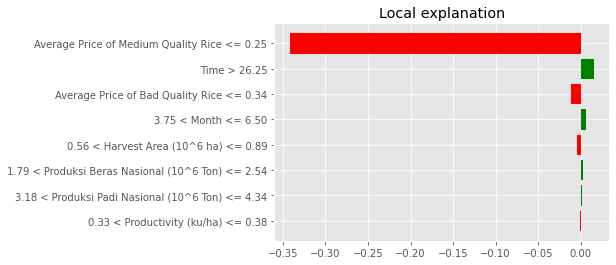

In [78]:
with plt.style.context("ggplot"):
    exp.as_pyplot_figure()

In [79]:
exp.as_list()

[('Average Price of Medium Quality Rice <= 0.25', -0.3419695108987486),
 ('Time > 26.25', 0.01563119351240746),
 ('Average Price of Bad Quality Rice <= 0.34', -0.011482333857730695),
 ('3.75 < Month <= 6.50', 0.006347157291511319),
 ('0.56 < Harvest Area (10^6 ha) <= 0.89', -0.004904657169182974),
 ('1.79 < Produksi Beras Nasional (10^6 Ton) <= 2.54', 0.0031325348007655517),
 ('3.18 < Produksi Padi Nasional (10^6 Ton) <= 4.34', 0.002011946773065649),
 ('0.33 < Productivity (ku/ha) <= 0.38', -0.0006615734984744297)]

### SIMPLE LINEAR REGRESSION
### Average Price of Medium Quality Rice

In [80]:
# Train the model
model2 = LinearRegression()
model2.fit(Time_train, HargaBerasMedium_train)

# Koefisien model
print ('Coefficients: ', model2.coef_)
print ('Intercept: ',model2.intercept_)

Coefficients:  [-0.00229664]
Intercept:  0.49106849309369927


Predicting on Train Data

In [81]:
AvgPriceMedium_train = pd.Series(model2.predict(Time_train), index=Time_train.index)

eval(evaluation_train,HargaBerasMedium_train,AvgPriceMedium_train,'Train SLR Medium')

Predicting on Test Data

In [82]:
AvgPriceMedium_pred = pd.Series(model2.predict(Time_test), index=Time_test.index)

eval(evaluation_test,HargaBerasMedium_test,AvgPriceMedium_pred,'Test SLR Medium')

### Multiple Linear Regression
### Average Price of Medium Quality Rice

In [83]:
regr_v2 = LinearRegression()
regr_v2.fit(x_medium_train, HargaBerasMedium_train)

print('Coefficients: ', regr_v2.coef_)
print ('Intercept: ',regr_v2.intercept_)

accuracy = regr_v2.score(x_medium_train,HargaBerasMedium_train)
print("Model Accuracy: ", accuracy)

Coefficients:  [ 4.36224415e-01  6.64173118e-01  2.43354045e-02 -2.09472043e-02
  2.69045621e-02  4.29502350e-02 -5.96904584e-04  1.39594750e-04]
Intercept:  -0.04733351038111061
Model Accuracy:  0.9603334885283522


Predicting on Train Data

In [84]:
AvgPriceMedium_train_v2 = pd.Series(regr_v2.predict(x_medium_train), index=x_medium_train.index)

eval(evaluation_train,HargaBerasMedium_train,AvgPriceMedium_train_v2,'Train MLR Medium')

Predicting on Test Data

In [85]:
AvgPriceMedium_pred_v2 = pd.Series(regr_v2.predict(x_medium_test), index=x_medium_test.index)

eval(evaluation_test,HargaBerasMedium_test,AvgPriceMedium_pred_v2,'Test MLR Medium')

explain the model's predictions using SHAP

Shapley on Train Data

In [86]:
explainer = shap.LinearExplainer(regr_v2, x_medium_train)
shap_values = explainer(x_medium_train)

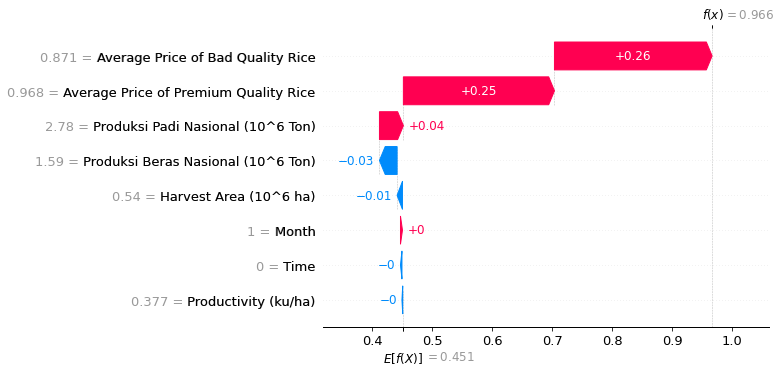

In [87]:
shap.plots.waterfall(shap_values[0])

In [88]:
shap_values_v2 = explainer.shap_values(x_medium_train)

In [89]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values_v2, x_medium_train,link="logit")

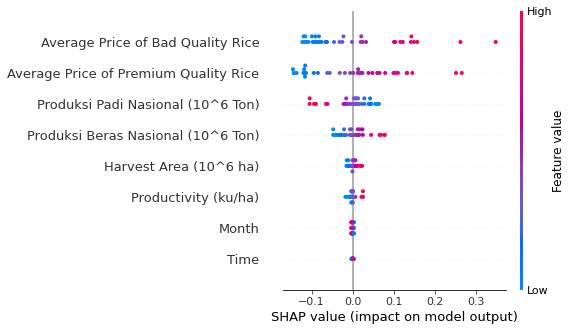

In [90]:
shap.summary_plot(shap_values_v2, x_medium_train)

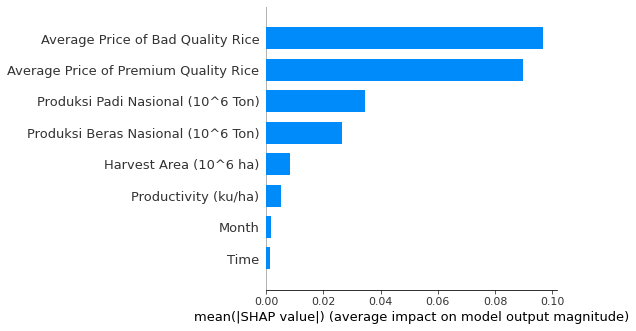

In [91]:
shap.summary_plot(shap_values_v2, x_medium_test, plot_type ="bar")

    The feature important that has the largest average SHAP value in the Multiple Linear Regression method on Average Price of Medium Quality Rice is  Average Price of Bad Quality Rice. High values of the Average Price of Bad Quality Rice variable have a high positive contribution on the prediction, while low values have a high negative contribution.

Shapley on Test Data

In [92]:
explainer_v2 = shap.LinearExplainer(regr_v2, x_medium_test)
shap_values_v2 = explainer_v2(x_medium_test)

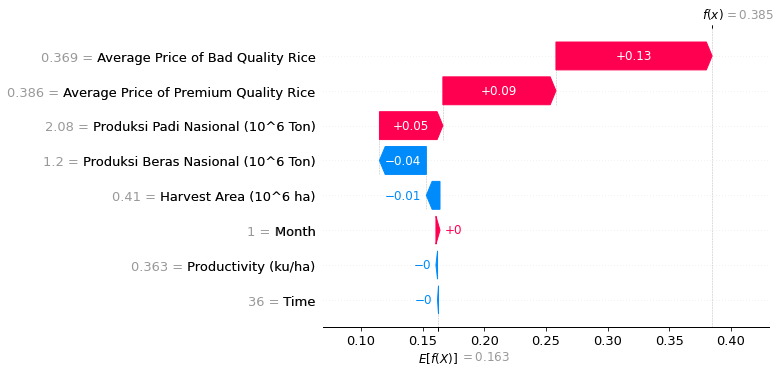

In [93]:
shap.plots.waterfall(shap_values_v2[0])

In [94]:
shap_values_v2 = explainer_v2.shap_values(x_medium_test)

In [95]:
shap.initjs()
shap.force_plot(explainer_v2.expected_value, shap_values_v2, x_medium_test,link="logit")

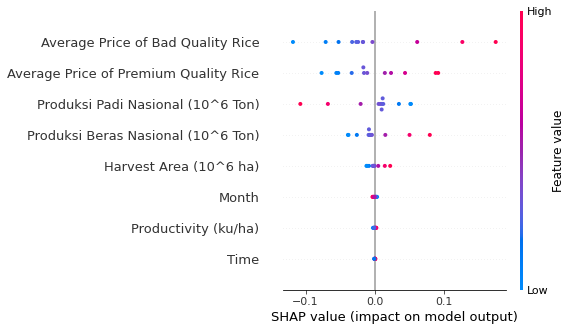

In [96]:
shap.summary_plot(shap_values_v2, x_medium_test)

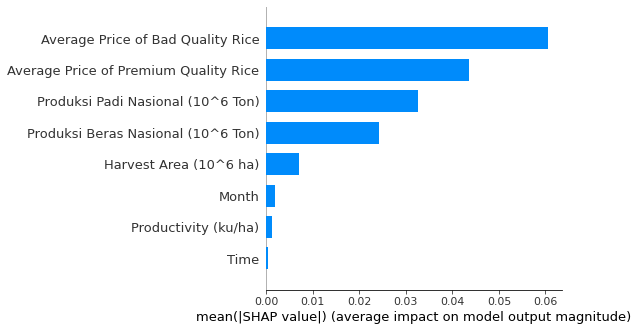

In [97]:
shap.summary_plot(shap_values_v2, x_medium_test, plot_type ="bar")

    The feature important that has the largest average SHAP value in the Multiple Linear Regression method on Average Price of Medium Quality Rice is  Average Price of Bad Quality Rice. High values of the Average Price of Bad Quality Rice variable have a high positive contribution on the prediction, while low values have a high negative contribution.

## explain the model's predictions using Lime

In [98]:
# Create the Explainer
explainer = lime.lime_tabular.LimeTabularExplainer(x_medium_train.values, feature_names=x_medium_train.columns.values.tolist(),
                                                  class_names=['Average Price of Medium Quality Rice'], verbose=True, mode='regression')

In [99]:
# Choose the 5th instance and use it to predict the results
j = 5
exp = explainer.explain_instance(x_medium_test.values[j], regr_v2.predict, num_features=len(x_medium_test.columns.values.tolist()))

Intercept 0.5150360417698787
Prediction_local [0.30072091]
Right: 0.12253236542978252


X does not have valid feature names, but LinearRegression was fitted with feature names


In [100]:
# Show the predictions
exp.show_in_notebook(show_table=True)

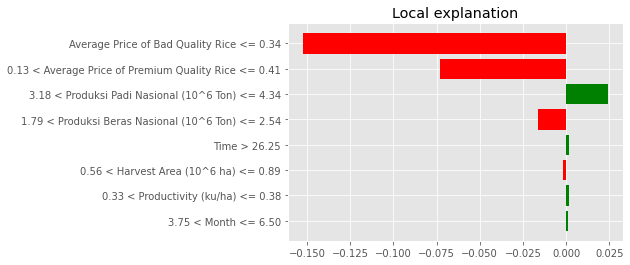

In [101]:
with plt.style.context("ggplot"):
    exp.as_pyplot_figure()

In [102]:
exp.as_list()

[('Average Price of Bad Quality Rice <= 0.34', -0.15222605165764672),
 ('0.13 < Average Price of Premium Quality Rice <= 0.41',
  -0.07311851973555789),
 ('3.18 < Produksi Padi Nasional (10^6 Ton) <= 4.34', 0.024135986982249853),
 ('1.79 < Produksi Beras Nasional (10^6 Ton) <= 2.54', -0.01634328946632337),
 ('Time > 26.25', 0.0020125312348295175),
 ('0.56 < Harvest Area (10^6 ha) <= 0.89', -0.001890013878493092),
 ('0.33 < Productivity (ku/ha) <= 0.38', 0.0017835318760215354),
 ('3.75 < Month <= 6.50', 0.0013306975170957675)]

## Random Forest
### Average Price of Medium Quality Rice

In [103]:
# Train the model
regressor2 = RandomForestRegressor(n_estimators = 1000, random_state=42)
regressor2.fit(x_medium_train, HargaBerasMedium_train)

accuracy = regressor2.score(x_medium_train, HargaBerasMedium_train)
print("Model Accuracy: ", accuracy)

Model Accuracy:  0.9893955420246877


Predicting on Train Data

In [104]:
AvgPriceMedium_train_with_randomforest = pd.Series(regressor2.predict(x_medium_train), index=x_medium_train.index)

eval(evaluation_train,HargaBerasMedium_train,AvgPriceMedium_train_with_randomforest,'Train RF Medium')

Predicting on Test Data

In [105]:
AvgPriceMedium_pred_with_randomforest = pd.Series(regressor2.predict(x_medium_test), index=x_medium_test.index)

eval(evaluation_test,HargaBerasMedium_test,AvgPriceMedium_pred_with_randomforest,'Test RF Medium')

Explain the model's predictions using SHAP

In [106]:
explainer = shap.TreeExplainer(regressor2)

Shapley on Train Data

In [107]:
shap_values = explainer.shap_values(x_medium_train)

In [108]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, x_medium_train,link="logit")

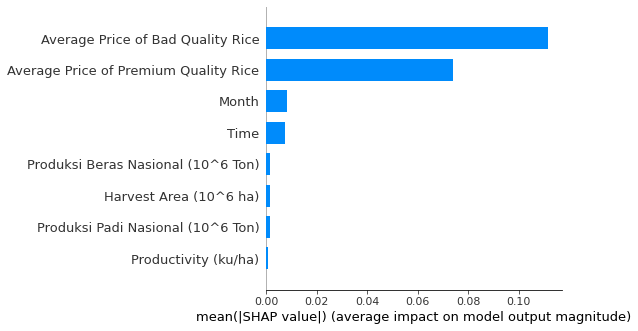

In [109]:
shap.summary_plot(shap_values, x_medium_train, plot_type="bar")

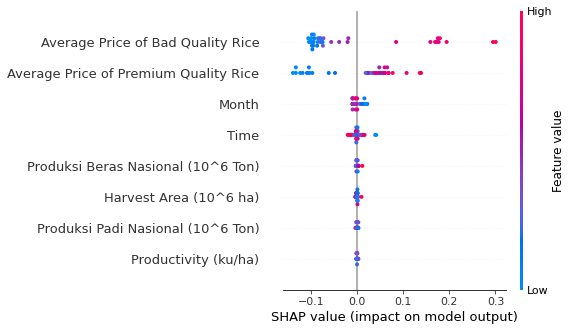

In [110]:
shap.summary_plot(shap_values, x_medium_train)

    The feature important that has the largest average SHAP value in the Random Forest Regression method on Average Price of Medium Quality Rice is  Average Price of Bad Quality Rice. High values of the Average Price of Bad Quality Rice variable have a high positive contribution on the prediction, while low values have a high negative contribution.

Shapley on Test Data

In [111]:
shap_values = explainer.shap_values(x_medium_test)

In [112]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, x_medium_test,link="logit")

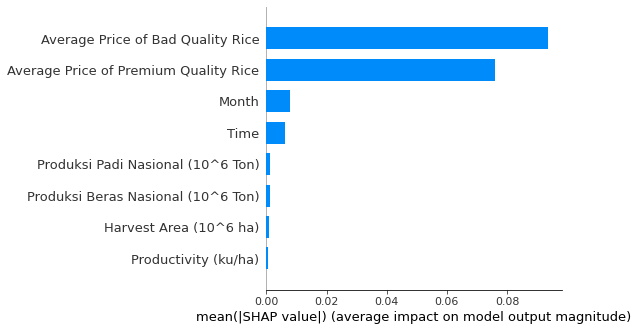

In [113]:
shap.summary_plot(shap_values, x_medium_test, plot_type="bar")

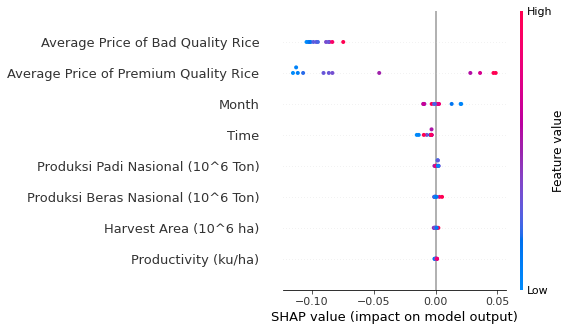

In [114]:
shap.summary_plot(shap_values, x_medium_test)

    The feature important that has the largest average SHAP value in the Random Forest Regression method on Average Price of Medium Quality Rice is  Average Price of Bad Quality Rice. High values of the Average Price of Premium Quality Rice variable have a high positive contribution on the prediction, while low values have a high negative contribution.

### explain the model's predictions using Lime

In [115]:
# Create the Explainer
explainer = lime.lime_tabular.LimeTabularExplainer(x_medium_train.values, feature_names=x_medium_train.columns.values.tolist(),
                                                  class_names=['Average Price of Medium Quality Rice'], verbose=True, mode='regression')

In [116]:
# Choose the 5th instance and use it to predict the results
j = 5
exp = explainer.explain_instance(x_medium_test.values[j], regressor2.predict, num_features=len(x_medium_test.columns.values.tolist()))

X does not have valid feature names, but RandomForestRegressor was fitted with feature names


Intercept 0.4954615600634434
Prediction_local [0.37387836]
Right: 0.24738578290394656


In [117]:
# Show the predictions
exp.show_in_notebook(show_table=True)

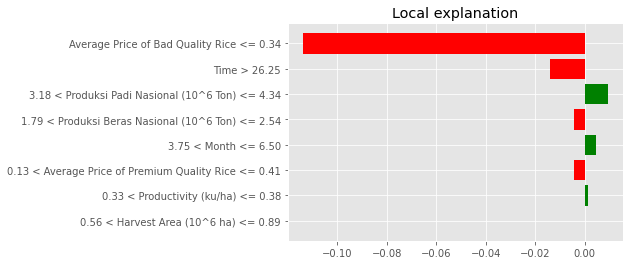

In [118]:
with plt.style.context("ggplot"):
    exp.as_pyplot_figure()

In [119]:
exp.as_list()

[('Average Price of Bad Quality Rice <= 0.34', -0.11378634536555973),
 ('Time > 26.25', -0.013957726446481196),
 ('3.18 < Produksi Padi Nasional (10^6 Ton) <= 4.34', 0.009214203884116047),
 ('1.79 < Produksi Beras Nasional (10^6 Ton) <= 2.54', -0.004518892317449558),
 ('3.75 < Month <= 6.50', 0.004453560825306669),
 ('0.13 < Average Price of Premium Quality Rice <= 0.41',
  -0.0044068204385749096),
 ('0.33 < Productivity (ku/ha) <= 0.38', 0.0012360122445610453),
 ('0.56 < Harvest Area (10^6 ha) <= 0.89', 0.0001828088935086588)]

### SIMPLE LINEAR REGRESSION
### Average Price of Bad Quality Rice

In [120]:
# Train the model
model3 = LinearRegression()
model3.fit(Time_train, HargaBerasLuarkualitas_train)

# Koefisien model
print ('Coefficients: ', model3.coef_)
print ('Intercept: ',model3.intercept_)

accuracy = model3.score(Time_train,HargaBerasLuarkualitas_train)
print("Model Accuracy: ", accuracy)

Coefficients:  [-0.00594912]
Intercept:  0.5794418120525432
Model Accuracy:  0.12276611555519934


Predicting on Train Data

In [121]:
AvgPriceBad_train = pd.Series(model3.predict(Time_train), index=Time_train.index)

eval(evaluation_train,HargaBerasLuarkualitas_train,AvgPriceBad_train,'Train SLR Bad')

Predicting on Test Data

In [122]:
AvgPriceBad_pred = pd.Series(model3.predict(Time_test), index=Time_test.index)

eval(evaluation_test,HargaBerasLuarkualitas_test,AvgPriceBad_pred,'Test SLR Bad')

### Multiple Linear Regression
### Average Price of Bad Quality Rice

In [123]:
regr_v3 = LinearRegression()
regr_v3.fit(x_bad_train,HargaBerasLuarkualitas_train)

print('Coefficients: ', regr_v3.coef_)
print ('Intercept: ',regr_v3.intercept_)

accuracy = regr_v3.score(x_bad_train,HargaBerasLuarkualitas_train)
print("Model Accuracy: ", accuracy)

Coefficients:  [-9.68381093e-02  7.75522258e-01 -4.57345912e-01  2.98033684e-02
  8.59360755e-02 -6.28402178e-02 -1.20386806e-04 -3.80233427e-03]
Intercept:  0.3011777704979387
Model Accuracy:  0.9312503283850257


Predicting on Train Data

In [124]:
AvgPriceBad_train_v2 = pd.Series(regr_v3.predict(x_bad_train), index=x_bad_train.index)

eval(evaluation_train,HargaBerasLuarkualitas_train,AvgPriceBad_train_v2,'Train MLR Bad')

Predicting on Test Data

In [125]:
AvgPriceBad_pred_v2 = pd.Series(regr_v3.predict(x_bad_test), index=x_bad_test.index)

eval(evaluation_test,HargaBerasLuarkualitas_test,AvgPriceBad_pred_v2,'Test MLR Bad')

Explain the model's predictions using SHAP

Shapley on Train Data

In [126]:
explainer = shap.LinearExplainer(regr_v3, x_bad_train)
shap_values = explainer(x_bad_train)

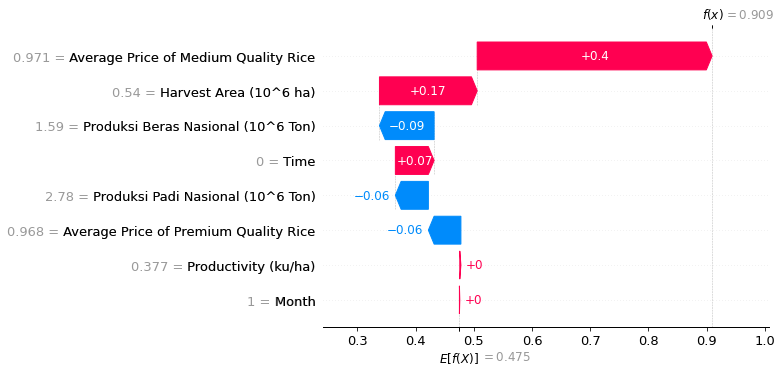

In [127]:
shap.plots.waterfall(shap_values[0])

In [128]:
shap_values = explainer.shap_values(x_bad_train)

In [129]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, x_bad_train,link="logit")

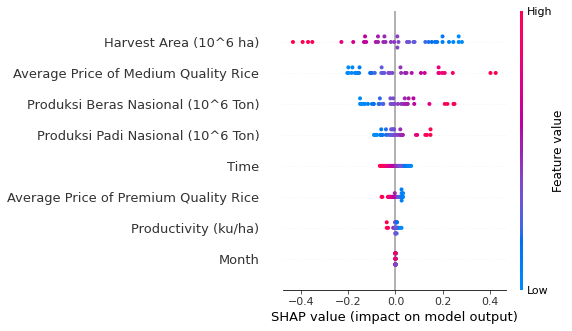

In [130]:
shap.summary_plot(shap_values, x_bad_train)

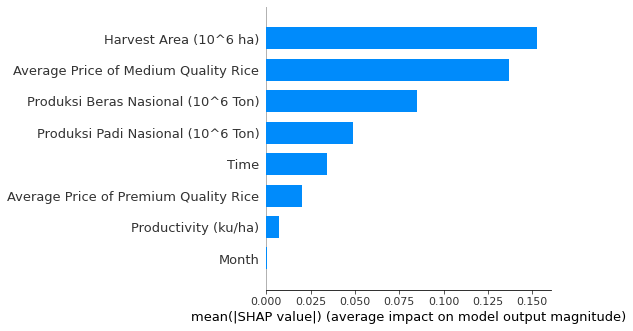

In [131]:
shap.summary_plot(shap_values, x_bad_train, plot_type ="bar")

    The feature important that has the largest average SHAP value in the Multiple Linear Regression method on Average Price of Bad Quality Rice is Harvest Area. High values of the Harvest Area variable have a high negative contribution on the prediction, while low values have a high positive contribution.

Shapley on Test Data

In [132]:
explainer_v3 = shap.LinearExplainer(regr_v3, x_bad_test)
shap_values_v3 = explainer_v3(x_bad_test)

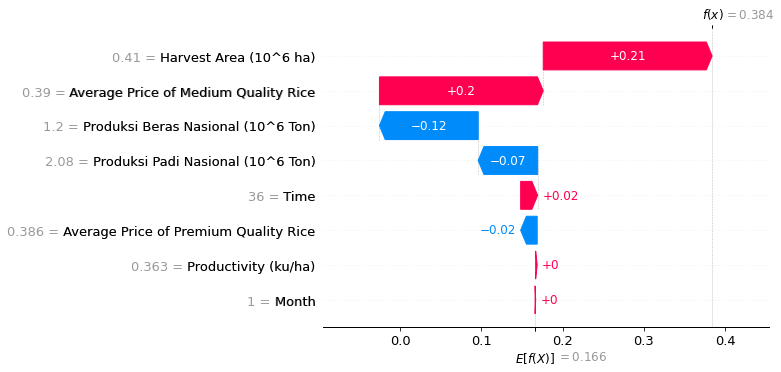

In [133]:
shap.plots.waterfall(shap_values_v3[0])

In [134]:
shap_values_v3 = explainer_v3.shap_values(x_bad_test)

In [135]:
shap.initjs()
shap.force_plot(explainer_v3.expected_value, shap_values_v3, x_bad_test,link="logit")

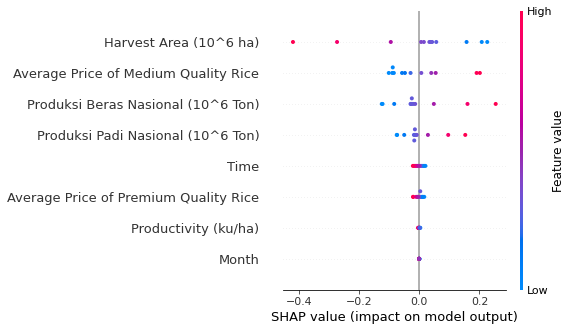

In [136]:
shap.summary_plot(shap_values_v3, x_bad_test)

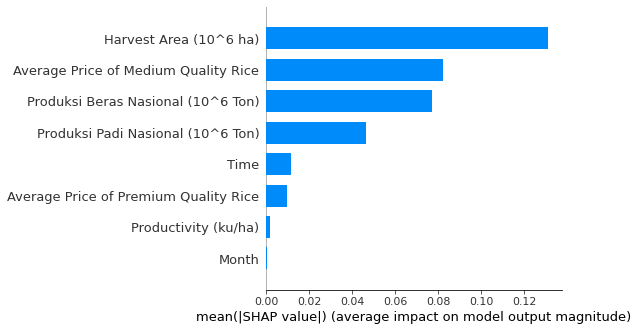

In [137]:
shap.summary_plot(shap_values_v3, x_bad_test, plot_type ="bar")

    The feature important that has the largest average SHAP value in the Multiple Linear Regression method on Bad Quality Rice is Harvest Area. High values of the Harvest Area variable have a high negative contribution on the prediction, while low values have a high positive contribution.

## explain the model's predictions using Lime

In [138]:
# Create the Explainer
explainer = lime.lime_tabular.LimeTabularExplainer(x_bad_train.values, feature_names=x_bad_train.columns.values.tolist(),
                                                  class_names=['Average Price of Bad Quality Rice'], verbose=True, mode='regression')

In [139]:
# Choose the 5th instance and use it to predict the results
j = 5
exp = explainer.explain_instance(x_bad_test.values[j], regr_v3.predict, num_features=len(x_bad_test.columns.values.tolist()))

Intercept 0.542649446997595
Prediction_local [0.286811]
Right: 0.07874783387877432


X does not have valid feature names, but LinearRegression was fitted with feature names


In [140]:
# Show the predictions
exp.show_in_notebook(show_table=True)

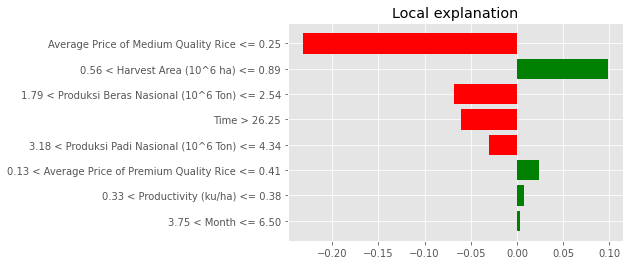

In [141]:
with plt.style.context("ggplot"):
    exp.as_pyplot_figure()

In [142]:
exp.as_list()

[('Average Price of Medium Quality Rice <= 0.25', -0.2313124137506894),
 ('0.56 < Harvest Area (10^6 ha) <= 0.89', 0.0983130722514413),
 ('1.79 < Produksi Beras Nasional (10^6 Ton) <= 2.54', -0.06779651663500796),
 ('Time > 26.25', -0.060975122182435525),
 ('3.18 < Produksi Padi Nasional (10^6 Ton) <= 4.34', -0.030402291793961065),
 ('0.13 < Average Price of Premium Quality Rice <= 0.41',
  0.024452413464040867),
 ('0.33 < Productivity (ku/ha) <= 0.38', 0.008078742987245797),
 ('3.75 < Month <= 6.50', 0.003803672283414123)]

## Random Forest
### Average Price of Bad Quality Rice

In [143]:
# Train the model
regressor3 = RandomForestRegressor(n_estimators = 1000, random_state=42)
regressor3.fit(x_bad_train, HargaBerasLuarkualitas_train)

accuracy = regressor3.score(x_bad_train, HargaBerasLuarkualitas_train)
print("Model Accuracy: ", accuracy)

Model Accuracy:  0.9719046545330888


Predicting on Train Data

In [144]:
AvgPriceBad_train_with_randomforest = pd.Series(regressor3.predict(x_bad_train), index=x_bad_train.index)

eval(evaluation_train,HargaBerasLuarkualitas_train,AvgPriceBad_train_with_randomforest,'Train RF Bad')

Predicting on Test Data

In [145]:
AvgPriceBad_pred_with_randomforest = pd.Series(regressor3.predict(x_bad_test), index=x_bad_test.index)

eval(evaluation_test,HargaBerasLuarkualitas_test,AvgPriceBad_pred_with_randomforest,'Test RF Bad')

Explain the model's predictions using SHAP

In [146]:
explainer = shap.TreeExplainer(regressor3)

Shapley on Train Data

In [147]:
shap_values = explainer.shap_values(x_bad_train)

In [148]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, x_bad_train,link="logit")

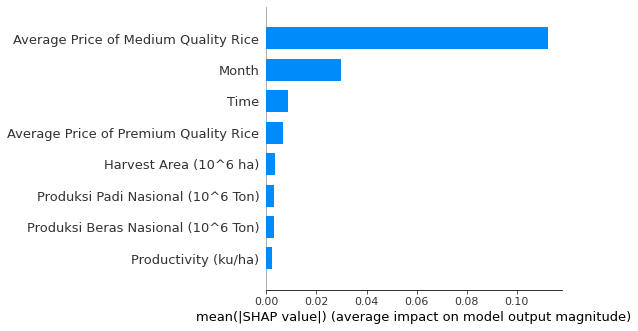

In [149]:
shap.summary_plot(shap_values, x_bad_train, plot_type="bar")

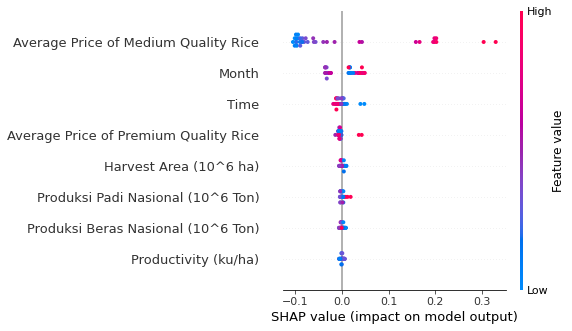

In [150]:
shap.summary_plot(shap_values, x_bad_train)

    The feature important that has the largest average SHAP value in the Random Forest Regression method on Average Price of Bad Quality Rice is Average Price of Medium Quality Rice. High values of the Average Price of Medium Quality Rice variable have a high positive contribution on the prediction, while low values have a high negative contribution.

Shapley on Test Data

In [151]:
shap_values = explainer.shap_values(x_bad_test)

In [152]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, x_bad_test,link="logit")

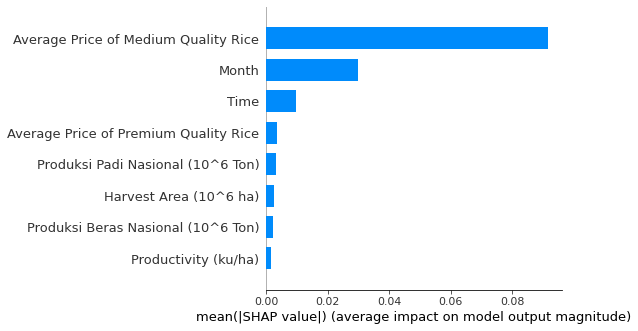

In [153]:
shap.summary_plot(shap_values, x_bad_test, plot_type="bar")

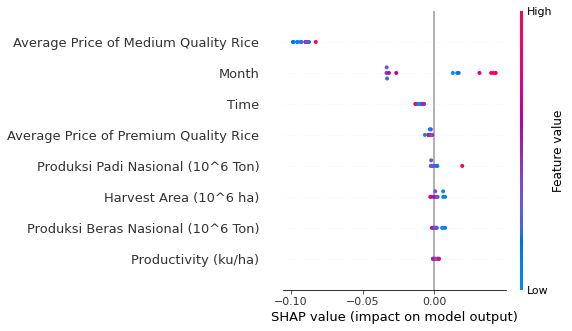

In [154]:
shap.summary_plot(shap_values, x_bad_test)

    The feature important that has the largest average SHAP value in the Random Forest Regression method on Average Price of Bad Quality Rice is Average Price of Medium Quality Rice. High values of the Month variable have a high positive contribution on the prediction, while low values have a high negative contribution.

### explain the model's predictions using Lime

In [155]:
# Create the Explainer
explainer = lime.lime_tabular.LimeTabularExplainer(x_bad_train.values, feature_names=x_bad_train.columns.values.tolist(),
                                                  class_names=['Average Price of Bad Quality Rice'], verbose=True, mode='regression')

In [156]:
# Choose the 5th instance and use it to predict the results
j = 5
exp = explainer.explain_instance(x_bad_test.values[j], regressor3.predict, num_features=len(x_bad_test.columns.values.tolist()))

X does not have valid feature names, but RandomForestRegressor was fitted with feature names


Intercept 0.5092399835405405
Prediction_local [0.32654607]
Right: 0.3348594844819906


In [157]:
# Show the predictions
exp.show_in_notebook(show_table=True)

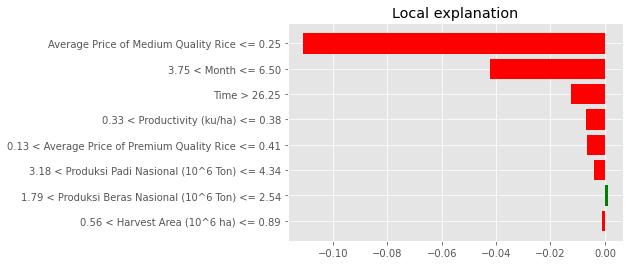

In [158]:
with plt.style.context("ggplot"):
    exp.as_pyplot_figure()

In [159]:
exp.as_list()

[('Average Price of Medium Quality Rice <= 0.25', -0.11088100675887481),
 ('3.75 < Month <= 6.50', -0.042415751062341016),
 ('Time > 26.25', -0.012332832943157889),
 ('0.33 < Productivity (ku/ha) <= 0.38', -0.006786441119629287),
 ('0.13 < Average Price of Premium Quality Rice <= 0.41',
  -0.006538747067063729),
 ('3.18 < Produksi Padi Nasional (10^6 Ton) <= 4.34', -0.0038324742564156892),
 ('1.79 < Produksi Beras Nasional (10^6 Ton) <= 2.54', 0.0010175774944119601),
 ('0.56 < Harvest Area (10^6 ha) <= 0.89', -0.0009242399896844586)]

Returns the MinMaxScaler value to get the actual data 

Premium Rice

In [160]:
HargaBerasPremium_test = HargaBerasPremium_test.to_numpy()
HargaBerasPremium_test = np.reshape(HargaBerasPremium_test, (-1,1)) 
HargaBerasPremium_test = mmscalar_premium.inverse_transform(HargaBerasPremium_test)
HargaBerasPremium_test = np.reshape(HargaBerasPremium_test, (12,))
HargaBerasPremium_test = pd.Series(HargaBerasPremium_test, index=x_premium_test.index)

In [161]:
AvgPricePremium_pred = AvgPricePremium_pred.to_numpy()
AvgPricePremium_pred = np.reshape(AvgPricePremium_pred, (-1,1)) 
AvgPricePremium_pred = mmscalar_premium.inverse_transform(AvgPricePremium_pred)
AvgPricePremium_pred = np.reshape(AvgPricePremium_pred, (12,))
AvgPricePremium_pred = pd.Series(AvgPricePremium_pred, index=x_premium_test.index)

In [162]:
AvgPricePremium_pred_v2 = AvgPricePremium_pred_v2.to_numpy()
AvgPricePremium_pred_v2 = np.reshape(AvgPricePremium_pred_v2, (-1,1)) 
AvgPricePremium_pred_v2 = mmscalar_premium.inverse_transform(AvgPricePremium_pred_v2)
AvgPricePremium_pred_v2 = np.reshape(AvgPricePremium_pred_v2, (12,))
AvgPricePremium_pred_v2 = pd.Series(AvgPricePremium_pred_v2, index=x_premium_test.index)

In [163]:
AvgPricePremium_pred_with_randomforest = AvgPricePremium_pred_with_randomforest.to_numpy()
AvgPricePremium_pred_with_randomforest = np.reshape(AvgPricePremium_pred_with_randomforest, (-1,1)) 
AvgPricePremium_pred_with_randomforest = mmscalar_premium.inverse_transform(AvgPricePremium_pred_with_randomforest)
AvgPricePremium_pred_with_randomforest = np.reshape(AvgPricePremium_pred_with_randomforest, (12,))
AvgPricePremium_pred_with_randomforest = pd.Series(AvgPricePremium_pred_with_randomforest, index=x_premium_test.index)

Medium

In [164]:
HargaBerasMedium_test = HargaBerasMedium_test.to_numpy()
HargaBerasMedium_test = np.reshape(HargaBerasMedium_test, (-1,1)) 
HargaBerasMedium_test = mmscalar_medium.inverse_transform(HargaBerasMedium_test)
HargaBerasMedium_test = np.reshape(HargaBerasMedium_test, (12,))
HargaBerasMedium_test = pd.Series(HargaBerasMedium_test, index=x_medium_test.index)

In [165]:
AvgPriceMedium_pred = AvgPriceMedium_pred.to_numpy()
AvgPriceMedium_pred = np.reshape(AvgPriceMedium_pred, (-1,1)) 
AvgPriceMedium_pred = mmscalar_medium.inverse_transform(AvgPriceMedium_pred)
AvgPriceMedium_pred = np.reshape(AvgPriceMedium_pred, (12,))
AvgPriceMedium_pred = pd.Series(AvgPriceMedium_pred, index=x_medium_test.index)

In [166]:
AvgPriceMedium_pred_v2 = AvgPriceMedium_pred_v2.to_numpy()
AvgPriceMedium_pred_v2 = np.reshape(AvgPriceMedium_pred_v2, (-1,1)) 
AvgPriceMedium_pred_v2 = mmscalar_medium.inverse_transform(AvgPriceMedium_pred_v2)
AvgPriceMedium_pred_v2 = np.reshape(AvgPriceMedium_pred_v2, (12,))
AvgPriceMedium_pred_v2 = pd.Series(AvgPriceMedium_pred_v2, index=x_medium_test.index)

In [167]:
AvgPriceMedium_pred_with_randomforest = AvgPriceMedium_pred_with_randomforest.to_numpy()
AvgPriceMedium_pred_with_randomforest = np.reshape(AvgPriceMedium_pred_with_randomforest, (-1,1)) 
AvgPriceMedium_pred_with_randomforest = mmscalar_medium.inverse_transform(AvgPriceMedium_pred_with_randomforest)
AvgPriceMedium_pred_with_randomforest = np.reshape(AvgPriceMedium_pred_with_randomforest, (12,))
AvgPriceMedium_pred_with_randomforest = pd.Series(AvgPriceMedium_pred_with_randomforest, index=x_medium_test.index)

Bad

In [168]:
HargaBerasLuarkualitas_test= HargaBerasLuarkualitas_test.to_numpy()
HargaBerasLuarkualitas_test= np.reshape(HargaBerasLuarkualitas_test, (-1,1)) 
HargaBerasLuarkualitas_test= mmscalar_bad.inverse_transform(HargaBerasLuarkualitas_test)
HargaBerasLuarkualitas_test= np.reshape(HargaBerasLuarkualitas_test, (12,))
HargaBerasLuarkualitas_test= pd.Series(HargaBerasLuarkualitas_test, index=x_bad_test.index)

In [169]:
AvgPriceBad_pred= AvgPriceBad_pred.to_numpy()
AvgPriceBad_pred= np.reshape(AvgPriceBad_pred, (-1,1)) 
AvgPriceBad_pred= mmscalar_bad.inverse_transform(AvgPriceBad_pred)
AvgPriceBad_pred= np.reshape(AvgPriceBad_pred, (12,))
AvgPriceBad_pred= pd.Series(AvgPriceBad_pred, index=x_bad_test.index)

In [170]:
AvgPriceBad_pred_v2= AvgPriceBad_pred_v2.to_numpy()
AvgPriceBad_pred_v2= np.reshape(AvgPriceBad_pred_v2, (-1,1)) 
AvgPriceBad_pred_v2= mmscalar_bad.inverse_transform(AvgPriceBad_pred_v2)
AvgPriceBad_pred_v2= np.reshape(AvgPriceBad_pred_v2, (12,))
AvgPriceBad_pred_v2= pd.Series(AvgPriceBad_pred_v2, index=x_bad_test.index)

In [171]:
AvgPriceBad_pred_with_randomforest= AvgPriceBad_pred_with_randomforest.to_numpy()
AvgPriceBad_pred_with_randomforest= np.reshape(AvgPriceBad_pred_with_randomforest, (-1,1)) 
AvgPriceBad_pred_with_randomforest= mmscalar_bad.inverse_transform(AvgPriceBad_pred_with_randomforest)
AvgPriceBad_pred_with_randomforest= np.reshape(AvgPriceBad_pred_with_randomforest, (12,))
AvgPriceBad_pred_with_randomforest= pd.Series(AvgPriceBad_pred_with_randomforest, index=x_bad_test.index)

### Collection of Visualizations

In [172]:
plt.style.use("seaborn-whitegrid")
plt.rc("figure", figsize=(11, 4))
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=14,
    titlepad=10,
)
%config InlineBackend.figure_format = 'retina'

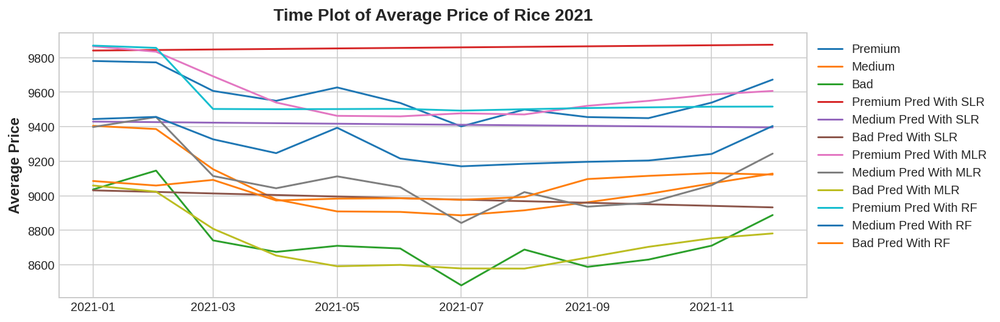

In [173]:
plt.plot(HargaBerasPremium_test,label='Premium') 
plt.plot(HargaBerasMedium_test,label='Medium') 
plt.plot(HargaBerasLuarkualitas_test,label='Bad')
plt.plot(AvgPricePremium_pred,label='Premium Pred With SLR')
plt.plot(AvgPriceMedium_pred,label='Medium Pred With SLR')
plt.plot(AvgPriceBad_pred,label='Bad Pred With SLR')
plt.plot(AvgPricePremium_pred_v2,label='Premium Pred With MLR')
plt.plot(AvgPriceMedium_pred_v2,label='Medium Pred With MLR')
plt.plot(AvgPriceBad_pred_v2,label='Bad Pred With MLR')
plt.plot(AvgPricePremium_pred_with_randomforest,label='Premium Pred With RF')
plt.plot(AvgPriceMedium_pred_with_randomforest,label='Medium Pred With RF')
plt.plot(AvgPriceBad_pred_with_randomforest,label='Bad Pred With RF')
plt.title('Time Plot of Average Price of Rice 2021' )
plt.ylabel("Average Price")
plt.legend(bbox_to_anchor = (1.0, 1), loc = 'upper left')
plt.show()

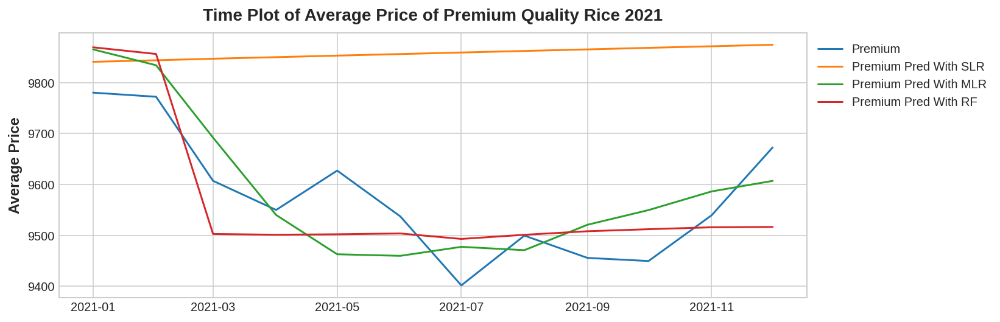

In [174]:
plt.plot(HargaBerasPremium_test,label='Premium') 
plt.plot(AvgPricePremium_pred,label='Premium Pred With SLR')
plt.plot(AvgPricePremium_pred_v2,label='Premium Pred With MLR')
plt.plot(AvgPricePremium_pred_with_randomforest,label='Premium Pred With RF')
plt.title('Time Plot of Average Price of Premium Quality Rice 2021')
plt.ylabel("Average Price")
plt.legend(bbox_to_anchor = (1.0, 1), loc = 'upper left')
plt.show()

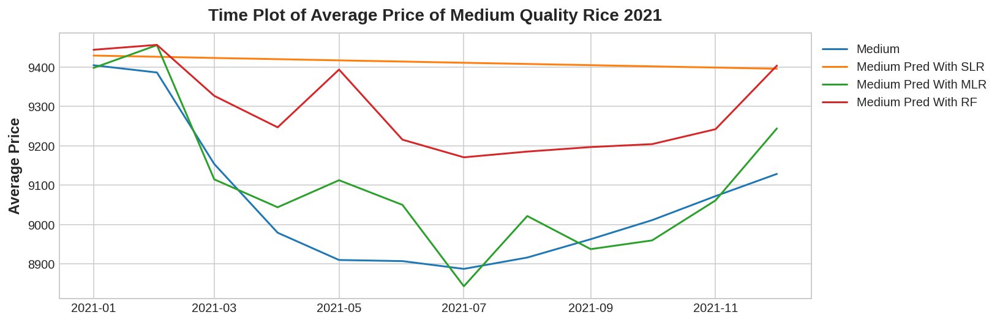

In [175]:
plt.plot(HargaBerasMedium_test,label='Medium') 
plt.plot(AvgPriceMedium_pred,label='Medium Pred With SLR')
plt.plot(AvgPriceMedium_pred_v2,label='Medium Pred With MLR')
plt.plot(AvgPriceMedium_pred_with_randomforest,label='Medium Pred With RF')
plt.title('Time Plot of Average Price of Medium Quality Rice 2021')
plt.ylabel("Average Price")
plt.legend(bbox_to_anchor = (1.0, 1), loc = 'upper left')
plt.show()

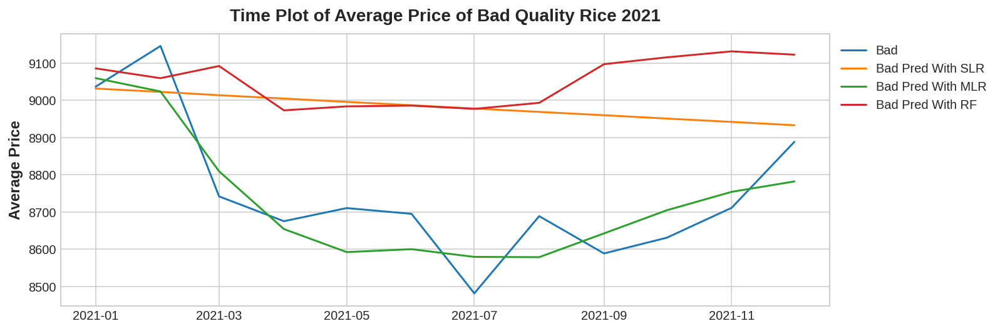

In [176]:
plt.plot(HargaBerasLuarkualitas_test,label='Bad')  
plt.plot(AvgPriceBad_pred,label='Bad Pred With SLR')
plt.plot(AvgPriceBad_pred_v2,label='Bad Pred With MLR')
plt.plot(AvgPriceBad_pred_with_randomforest,label='Bad Pred With RF')
plt.title('Time Plot of Average Price of Bad Quality Rice 2021' )
plt.ylabel("Average Price")
plt.legend(bbox_to_anchor = (1.0, 1), loc = 'upper left')
plt.show()

Mean Absolute Error (MAE) 

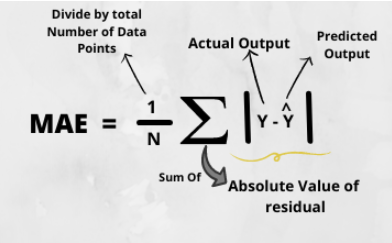

Mean Squared Error(MSE)

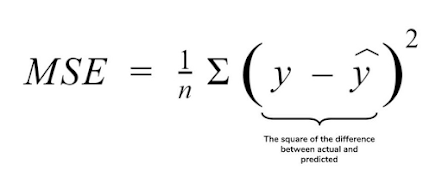

Mean Absolute Percentage Error (MAPE)

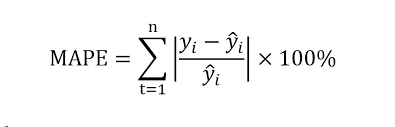

Root Mean Squared Error(RMSE) or root-mean-square deviation (RNSD)

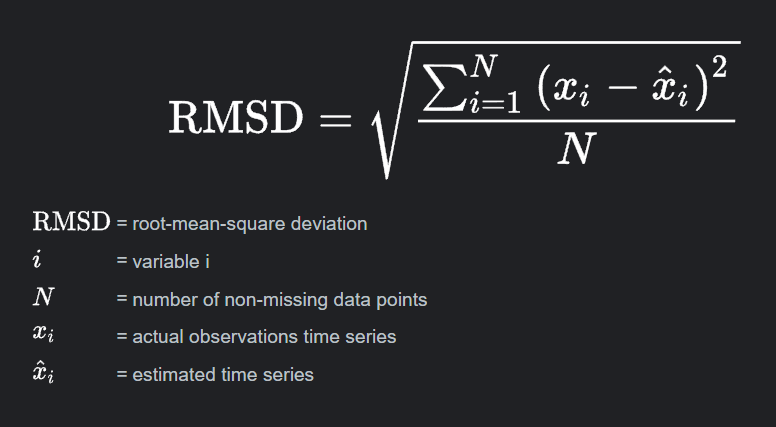


Root Mean Squared Log Error(RMSLE)

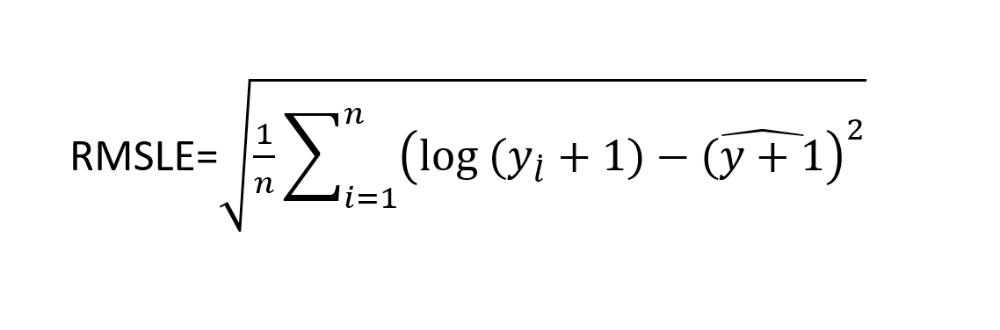

R Squared

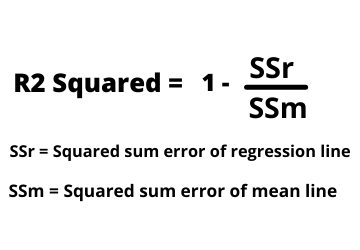

In [177]:
data_eval_train = pd.DataFrame(evaluation_train)
data_eval_train

,Train SLR Premium,Train MLR Premium,Train RF Premium,Train SLR Medium,Train MLR Medium,Train RF Medium,Train SLR Bad,Train MLR Bad,Train RF Bad
MAE,0.199663,0.053659,0.026792,0.174593,0.028788,0.016212,0.137865,0.036118,0.020101
MSE,0.061601,0.005201,0.001380,0.045610,0.001832,0.000490,0.027292,0.002139,0.000874
MAPE,1.109341,0.208021,0.088391,0.490324,0.069664,0.035887,0.307550,0.085273,0.046580
R squared,0.016691,0.916983,0.977975,0.012326,0.960333,0.989396,0.122766,0.931250,0.971905
RMSE,0.248196,0.072116,0.037146,0.213566,0.042799,0.022129,0.165202,0.046248,0.029565
RMSLE,-1.393535,-2.629473,-3.292912,-1.543810,-3.151233,-3.810849,-1.800585,-3.073736,-3.521170


In [178]:
data_eval_test = pd.DataFrame(evaluation_test)
data_eval_test

,Test SLR Premium,Test MLR Premium,Test RF Premium,Test SLR Medium,Test MLR Medium,Test RF Medium,Test SLR Bad,Test MLR Bad,Test RF Bad
MAE,2.890107e-01,7.358632e-02,7.417821e-02,2.656879e-01,5.516004e-02,1.738016e-01,1.687197e-01,5.158089e-02,2.099607e-01
MSE,9.923400e-02,6.825210e-03,7.371670e-03,8.639026e-02,4.822646e-03,3.723693e-02,3.616265e-02,3.186120e-03,5.302181e-02
MAPE,1.751580e+14,2.898343e+13,3.494515e+13,1.480969e+14,1.248780e+13,8.016463e+13,1.236908e+14,2.442093e+13,1.234848e+14
R squared,-6.003244e+00,5.183243e-01,4.797590e-01,-4.161004e+00,7.118924e-01,-1.224556e+00,-1.550581e+00,7.752803e-01,-2.739671e+00
RMSE,3.150143e-01,8.261483e-02,8.585843e-02,2.939222e-01,6.944527e-02,1.929687e-01,1.901648e-01,5.644573e-02,2.302646e-01
RMSLE,-1.155137e+00,-2.493566e+00,-2.455056e+00,-1.224440e+00,-2.667216e+00,-1.645227e+00,-1.659864e+00,-2.874476e+00,-1.468526e+00
